<a href="https://colab.research.google.com/github/keeeehun/RL/blob/main/problems/p_DDPG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import math
import random

import gym
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Normal

from IPython.display import clear_output
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
use_cuda = torch.cuda.is_available()
device   = torch.device("cuda" if use_cuda else "cpu")

# Replay Buffer

Replay Buffer로 사용할 Class를 정의해줍니다.
- store 함수를 통해 (S, A, R, S', done)을 저장합니다.
- sample 함수를 통해 batch size만큼의 history data를 dictonary 형태로 불러옵니다.

In [ ]:
class ReplayBuffer:
    def __init__(self, capacity):
        self.capacity = capacity
        self.buffer = []
        self.position = 0
    
    def push(self, state, action, reward, next_state, done):
        if len(self.buffer) < self.capacity:
            self.buffer.append(None)
        self.buffer[self.position] = (state, action, reward, next_state, done)
        self.position = (self.position + 1) % self.capacity
    
    def sample(self, batch_size):
        batch = random.sample(self.buffer, batch_size)
        state, action, reward, next_state, done = map(np.stack, zip(*batch))
        return state, action, reward, next_state, done
    
    def __len__(self):
        return len(self.buffer)

# Ornstein Uhlenbeck Process

Exploration을 위해서 output으로 나온 action에 noise를 추가해줍니다.

time step에 따라 temporally correlated한 noise를 주기 위함이며 관성이 있는 환경에서 학습시킬 때 효과적이기 때문에 이를 사용합니다.


In [ ]:
class OUNoise(object):
    def __init__(self, action_space, mu=0.0, theta=0.15, max_sigma=0.3, min_sigma=0.3, decay_period=100000):
        self.mu           = mu
        self.theta        = theta
        self.sigma        = max_sigma
        self.max_sigma    = max_sigma
        self.min_sigma    = min_sigma
        self.decay_period = decay_period
        self.action_dim   = action_space.shape[0]
        self.low          = action_space.low
        self.high         = action_space.high
        self.reset()
        
    def reset(self):
        self.state = np.ones(self.action_dim) * self.mu
        
    def evolve_state(self):
        x  = self.state
        dx = self.theta * (self.mu - x) + self.sigma * np.random.randn(self.action_dim)
        self.state = x + dx
        return self.state
    
    def get_action(self, action, t=0):
        ou_state = self.evolve_state()
        self.sigma = self.max_sigma - (self.max_sigma - self.min_sigma) * min(1.0, t / self.decay_period)
        return np.clip(action + ou_state, self.low, self.high)

# Matplotlib

Matplotlib을 사용해서 테스트 reward와 TD error를 그래프로 보여주는 함수입니다.

In [ ]:
def plot(frame_idx, rewards):
    clear_output(True)
    plt.figure(figsize=(20,5))
    plt.subplot(131)
    plt.title('frame %s. reward: %s' % (frame_idx, rewards[-1]))
    plt.plot(rewards)
    plt.show()

#Policy & Value function

본 실습에서 사용할 Pendulum 환경의 policy(actor)와 value function(critic)을 나타내는 뉴럴넷 모델입니다.

\\

## Value network(Critic)
- state와 action이 주어졌을 때 그에 해당하는 Q-value를 반환해줍니다.

## Policy network(Actor)
- get_action 함수를 통해 action을 반환해줍니다.

In [ ]:
class ValueNetwork(nn.Module):
    def __init__(self, num_inputs, num_actions, hidden_size, init_w=3e-3):
        super(ValueNetwork, self).__init__()
        
        self.linear1 = nn.Linear(num_inputs + num_actions, hidden_size)
        self.linear2 = nn.Linear(hidden_size, hidden_size)
        self.linear3 = nn.Linear(hidden_size, 1)
        
        self.linear3.weight.data.uniform_(-init_w, init_w)
        self.linear3.bias.data.uniform_(-init_w, init_w)
        
    def forward(self, state, action):
        x = torch.cat([state, action], 1)
        x = F.relu(self.linear1(x))
        x = F.relu(self.linear2(x))
        x = self.linear3(x)
        return x
    

class PolicyNetwork(nn.Module):
    def __init__(self, num_inputs, num_actions, hidden_size, init_w=3e-3):
        super(PolicyNetwork, self).__init__()
        
        self.linear1 = nn.Linear(num_inputs, hidden_size)
        self.linear2 = nn.Linear(hidden_size, hidden_size)
        self.linear3 = nn.Linear(hidden_size, num_actions)
        
        self.linear3.weight.data.uniform_(-init_w, init_w)
        self.linear3.bias.data.uniform_(-init_w, init_w)
        
    def forward(self, state):
        x = F.relu(self.linear1(state))
        x = F.relu(self.linear2(x))
        x = torch.tanh(self.linear3(x))
        return x
    
    def get_action(self, state):
        state  = torch.FloatTensor(state).unsqueeze(0).to(device)
        action = self.forward(state)
        return action.detach().cpu().numpy()[0, 0]

# Train

Replay buffer에서 가져온 batch data를 사용해서 모델을 업데이트 하는 함수입니다.

In [ ]:
def ddpg_update(batch_size, 
           gamma = 0.99,
           min_value=-np.inf,
           max_value=np.inf,
           soft_tau=1e-2):
    
    state, action, reward, next_state, done = replay_buffer.sample(batch_size)
    
    state      = torch.FloatTensor(state).to(device)
    next_state = torch.FloatTensor(next_state).to(device)
    action     = torch.FloatTensor(action).to(device)
    reward     = torch.FloatTensor(reward).unsqueeze(1).to(device)
    done       = torch.FloatTensor(np.float32(done)).unsqueeze(1).to(device)

    '''
    To do
    '''
    # Compute loss for Value network(Critic)
    next_action    = 
    target_value   = 
    expected_value = 
    expected_value = torch.clamp(expected_value, min_value, max_value)

    value = 
    value_loss = 

    value_optimizer.zero_grad()
    value_loss.backward()
    value_optimizer.step()

    # Compute loss for Policy network(Actor)
    policy_loss = 
    policy_loss = 

    policy_optimizer.zero_grad()
    policy_loss.backward()
    policy_optimizer.step()

    # Soft target update
    for target_param, param in zip(target_value_net.parameters(), value_net.parameters()):
            target_param.data.copy_(
                '''
                To do
                '''
            )

    for target_param, param in zip(target_policy_net.parameters(), policy_net.parameters()):
            target_param.data.copy_(
                '''
                To do
                '''
            )

# Main

트레이닝에 필요한 환경, 모델, loss, optimizer 등을 정의하는 코드입니다.

In [ ]:
env = gym.make("Pendulum-v0")
ou_noise = OUNoise(env.action_space)

state_dim  = env.observation_space.shape[0]
action_dim = env.action_space.shape[0]
hidden_dim = 256

value_net  = ValueNetwork(state_dim, action_dim, hidden_dim).to(device)
policy_net = PolicyNetwork(state_dim, action_dim, hidden_dim).to(device)

target_value_net  = ValueNetwork(state_dim, action_dim, hidden_dim).to(device)
target_policy_net = PolicyNetwork(state_dim, action_dim, hidden_dim).to(device)

for target_param, param in zip(target_value_net.parameters(), value_net.parameters()):
    target_param.data.copy_(param.data)

for target_param, param in zip(target_policy_net.parameters(), policy_net.parameters()):
    target_param.data.copy_(param.data)
    
    
value_lr  = 1e-3
policy_lr = 1e-4

value_optimizer  = optim.Adam(value_net.parameters(),  lr=value_lr)
policy_optimizer = optim.Adam(policy_net.parameters(), lr=policy_lr)

value_criterion = nn.MSELoss()

replay_buffer_size = 1000000
replay_buffer = ReplayBuffer(replay_buffer_size)

DDPG 트레이닝을 실행하는 메인 루프입니다.

- max frame만큼 돌면서 매 스탭마다 (S, A, R, S', done)을 Replay Buffer에 push 함수를 통해 넣어줍니다.
- Replay Buffer의 len이 batch size 이상이 되면 ddpg_update 함수를 통해 모델 업데이트를 실행합니다.

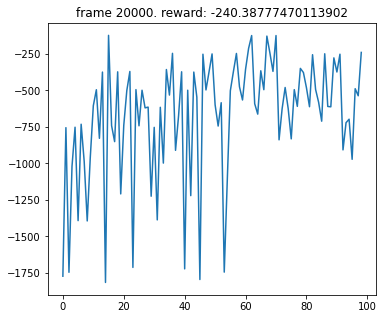

In [ ]:
max_frames  = 20000
max_steps   = 500
frame_idx   = 0
rewards     = []
batch_size  = 128

best_test_reward = -999999


while frame_idx < max_frames:
    state = env.reset()
    ou_noise.reset()
    episode_reward = 0
    
    for step in range(max_steps):
        action = policy_net.get_action(state)
        action = ou_noise.get_action(action, step)
        next_state, reward, done, _ = env.step(action)
        
        replay_buffer.push(state, action, reward, next_state, done)
        if len(replay_buffer) > batch_size:
            ddpg_update(batch_size)
        
        state = next_state
        episode_reward += reward
        frame_idx += 1
        
        if frame_idx % max(1000, max_steps + 1) == 0:
            plot(frame_idx, rewards)
        
        if done:
            if best_test_reward <= episode_reward:
                best_test_reward = episode_reward
                torch.save(policy_net.state_dict(), "policy_model.pt")
            break
    
    rewards.append(episode_reward)

In [ ]:
!apt update
!apt install xvfb
!pip install pyvirtualdisplay
!pip install gym-notebook-wrapper

Hit:1 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:3 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease [1,581 B]
Get:5 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Get:6 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Get:7 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Ign:8 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:9 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Get:11 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Packages [901 kB]
Get:12 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelea

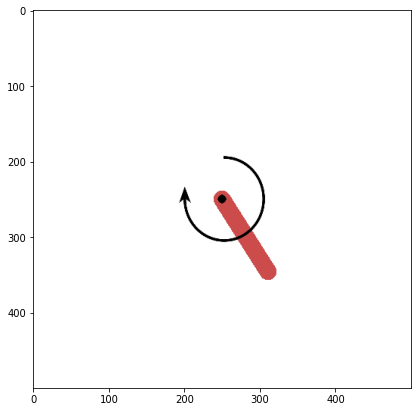

In [ ]:
import gnwrapper
import gym

env = gnwrapper.LoopAnimation(gym.make('Pendulum-v0'))

obs = env.reset()
for _ in range(500):
    obs, rew, done, _ = env.step(env.action_space.sample()) # Take random action
    env.render()
    if done:
        obs = env.reset()

env.display()

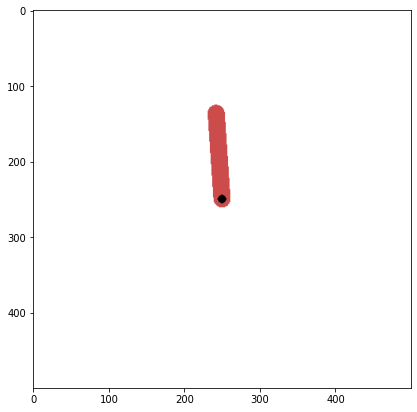

In [ ]:
policy_net.load_state_dict(torch.load("policy_model.pt"))

env = gnwrapper.LoopAnimation(gym.make('Pendulum-v0'))

obs = env.reset()

for _ in range(500):
    action = policy_net.get_action(obs)  # Take action from trained model
    action = ou_noise.get_action(action)
    env.render()
    obs, rew, done, _ = env.step(action)
    if done:
        obs = env.reset()

env.display()